In [2]:
import sys
import numpy as np
import pandas as pd
import matplotlib
import seaborn as sns
import scipy
import matplotlib.pyplot as plt

# print('Python: {}'.format(sys.version))
# print('Numpy: {}'.format(numpy.__version__))
# print('Pandas: {}'.format(pandas.__version__))
# print('Matplotlib: {}'.format(matplotlib.__version__))
# print('Seaborn: {}'.format(seaborn.__version__))
# print('Scipy: {}'.format(scipy.__version__))

In [3]:
cd C:\Users\mbade\Downloads\creditcardML-master\Credit Card Fraud Detection

C:\Users\mbade\Downloads\creditcardML-master\Credit Card Fraud Detection


In [ ]:
#change style of your notebook if you want
import jupyterthemes as jt
!jt -t grade3 -fs 95 -tfs 11 -nfs 115 -cellw 88% -T

### 2. The Data Set

In the following cells, we will import our dataset from a .csv file as a Pandas DataFrame.  Furthermore, we will begin exploring the dataset to gain an understanding of the type, quantity, and distribution of data in our dataset.  For this purpose, we will use Pandas' built-in describe feature, as well as parameter histograms and a correlation matrix. 

In [4]:
# Load the dataset from the csv file using pandas
data = pd.read_csv('creditcard.csv')
data1 = pd.read_csv('creditcard.csv')
data2 = pd.read_csv('creditcard.csv')

#create a list of said datasets (just for show i used 3 of the same dataset)
datasets = ['data','data1','data2']

data.shape

(284807, 31)

In [5]:
# Start exploring the dataset
print(data.columns)

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')


In [10]:
# Print the shape of the data
data = pd.read_csv('creditcard.csv')
data = data.sample(frac=0.1, random_state = 1)
print(data.columns)
print(data.shape)
print(data.describe())

# V1 - V28 are the results of a PCA Dimensionality reduction to protect user identities and sensitive features

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')
(28481, 31)
                Time            V1            V2            V3            V4  \
count   28481.000000  28481.000000  28481.000000  28481.000000  28481.000000   
mean    94705.035216     -0.001143     -0.018290      0.000795      0.000350   
std     47584.727034      1.994661      1.709050      1.522313      1.420003   
min         0.000000    -40.470142    -63.344698    -31.813586     -5.266509   
25%     53924.000000     -0.908809     -0.610322     -0.892884     -0.847370   
50%     84551.000000      0.031139      0.051775      0.178943     -0.017692   
75%    139392.000000      1.320048      0.792685      1.035197      0.737312   
max    172784.000000      2.411499     17.418649      4.069865     16.715537   

  

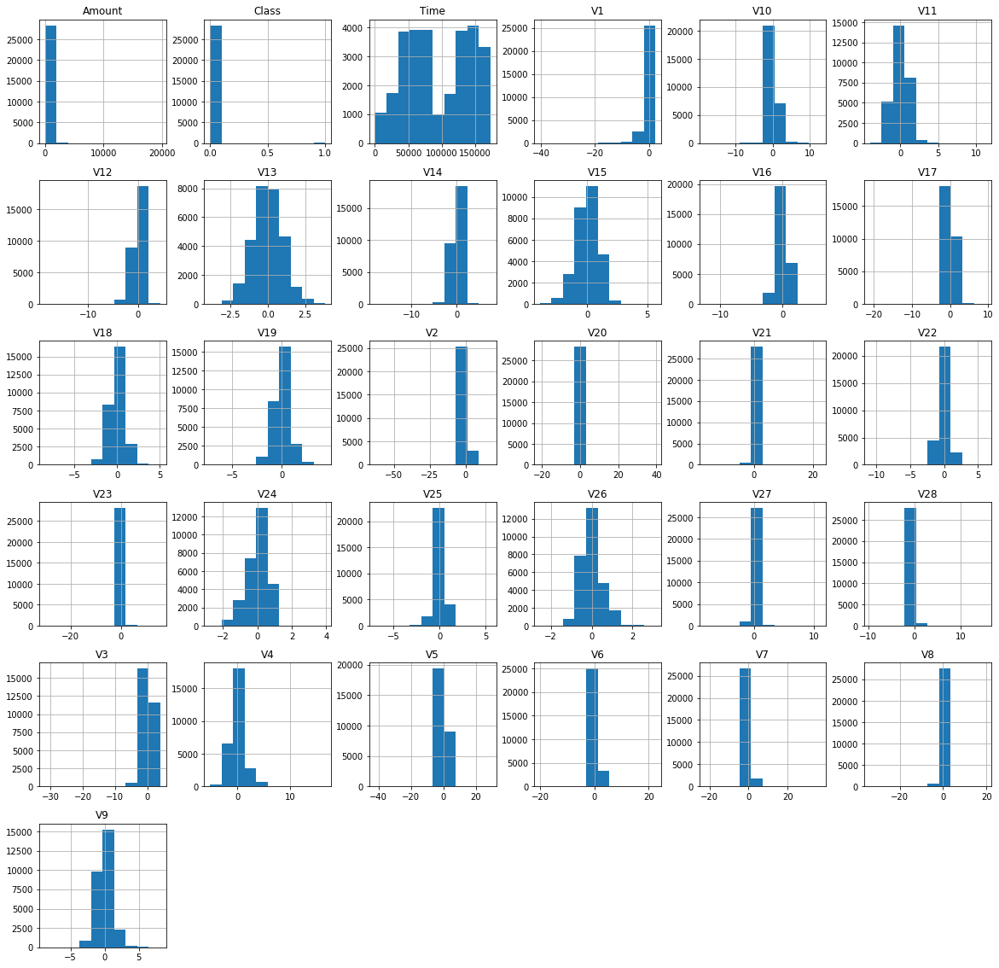

In [8]:
# Plot histograms of each parameter 
data.hist(figsize = (20, 20))
plt.show()

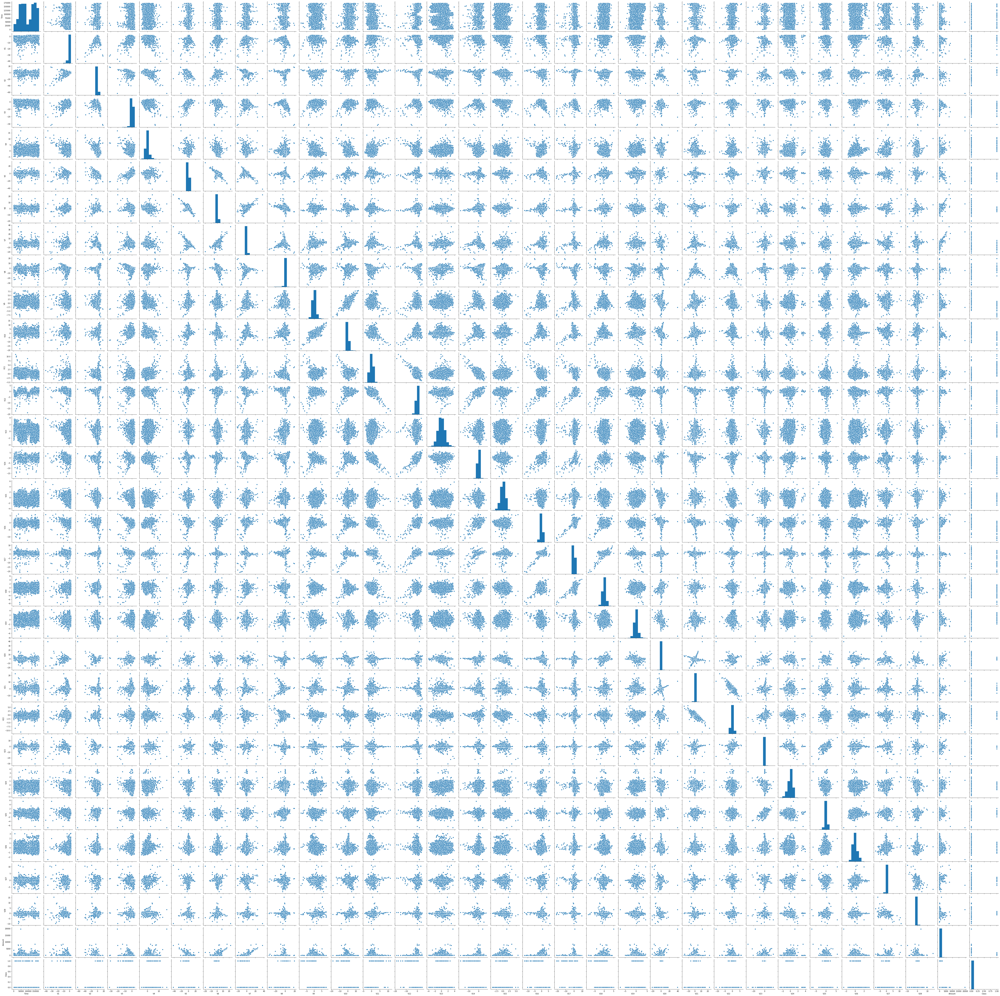

In [7]:
sns.pairplot(data)

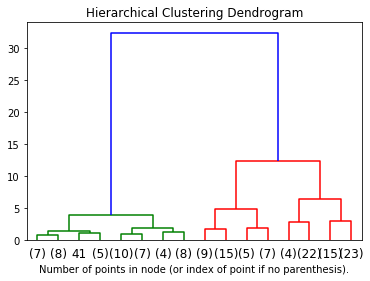

In [11]:
#dendrogram
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

iris = load_iris()
X = iris.data

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

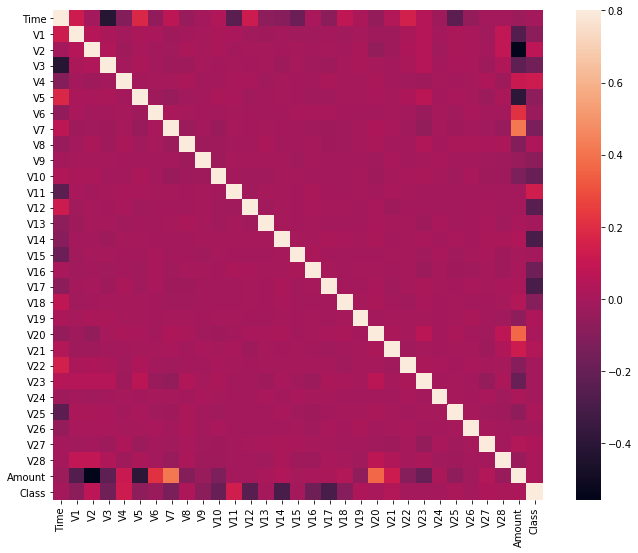

In [14]:
# Correlation matrix
corrmat = data.corr()
fig = plt.figure(figsize = (12, 9))

sns.heatmap(corrmat, vmax = .8, square = True)
plt.show()

In [14]:
# Determine number of fraud cases in dataset
Fraud = data[data['Class'] == 1]
Valid = data[data['Class'] == 0]

outlier_fraction = len(Fraud)/float(len(Valid))
print(outlier_fraction)

print('Fraud Cases: {}'.format(len(data[data['Class'] == 1])))
print('Valid Transactions: {}'.format(len(data[data['Class'] == 0])))

print(Fraud.head())
print(Valid.head())

0.0017234102419808666
Fraud Cases: 49
Valid Transactions: 28432
            Time         V1        V2         V3        V4        V5  \
235644  148479.0  -1.541678  3.846800  -7.604114  3.121459 -1.254924   
254344  156685.0  -0.129778  0.141547  -0.894702 -0.457662  0.810608   
192529  129741.0  -1.396204  2.618584  -6.036770  3.552454  1.030091   
176049  122608.0  -2.003460 -7.159042  -4.050976  1.309580 -2.058102   
42769    41237.0 -10.281784  6.302385 -13.271718  8.925115 -9.975578   

              V6         V7        V8        V9  ...       V21       V22  \
235644 -2.084875  -2.385027  1.471140 -2.530507  ...  1.096405  1.064222   
254344 -0.504723   1.373588 -0.209476  0.208494  ... -0.032643 -0.246526   
192529 -2.950358  -1.528506  0.189319 -1.433554  ...  0.143177 -0.390176   
176049 -0.098621   2.880083 -0.727484  1.460381  ...  1.244287 -1.015232   
42769  -2.832513 -12.703253  6.706846 -7.078424  ...  2.479414  0.366933   

             V23       V24       V25       V26

In [15]:
# Get all the columns from the dataFrame
columns = data.columns.tolist()

# Filter the columns to remove data we do not want
columns = [c for c in columns if c not in ["Class"]]

# Store the variable we'll be predicting on
target = "Class"

X = data[columns]
Y = data[target]

# Print shapes
print(X.shape)
print(Y.shape)
print(columns)
print(X.head())
print(Y.head())

(28481, 30)
(28481,)
['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']
            Time        V1        V2        V3        V4        V5        V6  \
169876  119907.0 -0.611712 -0.769705 -0.149759 -0.224877  2.028577 -2.019887   
127467   78340.0 -0.814682  1.319219  1.329415  0.027273 -0.284871 -0.653985   
137900   82382.0 -0.318193  1.118618  0.969864 -0.127052  0.569563 -0.532484   
21513    31717.0 -1.328271  1.018378  1.775426 -1.574193 -0.117696 -0.457733   
134700   80923.0  1.276712  0.617120 -0.578014  0.879173  0.061706 -1.472002   

              V7        V8        V9  ...       V20       V21       V22  \
169876  0.292491 -0.523020  0.358468  ... -0.196039 -0.075208  0.045536   
127467  0.321552  0.435975 -0.704298  ... -0.009041 -0.128619 -0.368565   
137900  0.706252 -0.064966 -0.463271  ...  0.206028 -0.305402 -0.77

## 3. Unsupervised Outlier Detection

Now that we have processed our data, we can begin deploying our machine learning algorithms.  We will use the following techniques: 

**Local Outlier Factor (LOF)**

The anomaly score of each sample is called Local Outlier Factor. It measures the local deviation of density of a 
given sample with respect to its neighbors. It is local in that the anomaly score depends on how isolated the 
object is with respect to the surrounding neighborhood.


**Isolation Forest Algorithm**

The IsolationForest ‘isolates’ observations by randomly selecting a feature and then randomly selecting 
a split value between the maximum and minimum values of the selected feature.

Since recursive partitioning can be represented by a tree structure, the number of splittings required to 
isolate a sample is equivalent to the path length from the root node to the terminating node.

This path length, averaged over a forest of such random trees, is a measure of normality and our decision function.

Random partitioning produces noticeably shorter paths for anomalies. Hence, when a forest of random trees 
collectively produce shorter path lengths for particular samples, they are highly likely to be anomalies.

In [16]:
#decisiontreeclassifier 
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Create the training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=123)

# Instantiate the classifier: dt_clf_4
dt_clf_4 = DecisionTreeClassifier(random_state=123, max_depth=4)

# Fit the classifier to the training set
dt_clf_4.fit(X_train,y_train)

# Predict the labels of the test set: y_pred_4
y_pred_4 = dt_clf_4.predict(X_test)

# Compute the accuracy of the predictions: accuracy
accuracy = float(np.sum(y_pred_4==y_test))/y_test.shape[0]
print("accuracy:", accuracy)

accuracy: 0.9989468141126909


In [17]:
#xgboost and decisiontreeclassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb

state=1

#xgboost
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
xg_cl = xgb.XGBClassifier(objective='binary:logistic',n_estimators=10,seed=state)
xg_cl.fit(X_train, y_train)

#decisiontreeclassifier
dt_clf_4 = DecisionTreeClassifier(random_state=123, max_depth=4)
dt_clf_4.fit(X_train,y_train)

# Predict the labels of the test set: y_pred_4
preds = xg_cl.predict(X_test)
y_pred_4 = dt_clf_4.predict(X_test)
accuracy_xg_cl = float(np.sum(preds==y_test))/y_test.shape[0]
accuracy_dt_clf_4 = float(np.sum(y_pred_4==y_test))/y_test.shape[0]

#print it
print("accuracy_dt_clf_4:", accuracy)
print("accuracy_xg_cl: %f" % (accuracy))

accuracy_dt_clf_4: 0.9989468141126909
accuracy_xg_cl: 0.998947


In [18]:
#xgboost

# import xgboost as xgb
# import pandas as pd

# Create arrays for the features and the target: X, y
#X, y = df.iloc[:,:-1], df.iloc[:,-1]

# Create the DMatrix from X and y: churn_dmatrix
churn_dmatrix = xgb.DMatrix(data=data.iloc[:,:-1], label=data.Class)
data.iloc[1]
X.iloc[1]

# Create the parameter dictionary: params
params = {"objective":"reg:logistic", "max_depth":3}

# Perform cross-validation: cv_results
cv_results_error = xgb.cv(dtrain=churn_dmatrix,params=params,\
                          nfold=3,num_boost_round=5,metrics="error",as_pandas=True,seed=123)
cv_results_auc = xgb.cv(dtrain=churn_dmatrix,params=params,\
                        nfold=3,num_boost_round=5,metrics="auc", as_pandas=True, seed=123)

# Print cv_results
print(cv_results_error)
print(cv_results_auc)

# Print the %
print(((1-cv_results_error["test-error-mean"]).iloc[-1]))
print((cv_results_auc["test-auc-mean"]).iloc[-1])

   train-error-mean  train-error-std  test-error-mean  test-error-std
0          0.000650         0.000089         0.001158        0.000149
1          0.000474         0.000043         0.001018        0.000049
2          0.000439         0.000066         0.000983        0.000179
3          0.000422         0.000074         0.000983        0.000099
4          0.000422         0.000074         0.000948        0.000086
   train-auc-mean  train-auc-std  test-auc-mean  test-auc-std
0        0.881650       0.021557       0.826325      0.004994
1        0.893145       0.016618       0.874309      0.018450
2        0.909354       0.018552       0.886147      0.014325
3        0.918986       0.013704       0.898063      0.025278
4        0.918980       0.013712       0.898062      0.025256
0.999052
0.898062


In [16]:
#isolationforest and localoutlierfactor
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

# define random states
state = 1

# define outlier detection tools to be compared
classifiers = {
    "Isolation Forest": IsolationForest(max_samples=len(X),
                                        contamination=outlier_fraction,
                                        random_state=state),
    "Local Outlier Factor": LocalOutlierFactor(n_neighbors=20,
                                               contamination=outlier_fraction)
}

n_outliers = len(Fraud)
for i, (clf_name,clf) in enumerate(classifiers.items()):
    #Fit the data and tag outliers
    if clf_name == "Local Outlier Factor":
        y_pred = clf.fit_predict(X)
        scores_prediction = clf.negative_outlier_factor_
    elif clf_name == "Support Vector Machine":
        clf.fit(X)
        y_pred = clf.predict(X)
    else:    
        clf.fit(X)
        scores_prediction = clf.decision_function(X)
        y_pred = clf.predict(X)
    #Reshape the prediction values to 0 for Valid transactions , 1 for Fraud transactions
    y_pred[y_pred == 1] = 0
    y_pred[y_pred == -1] = 1
    n_errors = (y_pred != Y).sum()
    # Run Classification Metrics
    print("{}: {}".format(clf_name,n_errors))
    print("Accuracy Score :")
    print(accuracy_score(Y,y_pred))
    print("Classification Report :")
    print(classification_report(Y,y_pred))

Isolation Forest: 71
Accuracy Score :
0.99750711000316
Classification Report :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.28      0.29      0.28        49

    accuracy                           1.00     28481
   macro avg       0.64      0.64      0.64     28481
weighted avg       1.00      1.00      1.00     28481

Local Outlier Factor: 97
Accuracy Score :
0.9965942207085425
Classification Report :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.02      0.02      0.02        49

    accuracy                           1.00     28481
   macro avg       0.51      0.51      0.51     28481
weighted avg       1.00      1.00      1.00     28481



In [20]:
#KNeighborsClassifier predicting labels
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

#train test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)

# Create arrays for the features and the response variable
y = data['Class'].values
X = data.drop('Class', axis=1).values

y
X

# Create a k-NN classifier with 6 neighbors
knn = KNeighborsClassifier(n_neighbors=6)

# Fit the classifier to the data
knn.fit(X,y)

# Predict the labels for the training data X
y_pred = knn.predict(X)
y_pred

print("Prediction: {}".format(y_pred))
print(knn.score(X_test, y_test))

Prediction: [0 0 0 ... 0 0 0]
0.9989468141126909


In [21]:
df = data
# df.head()

table_bar = df.head(10).style.bar(color='lightblue')
table_bar

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
169876,119907.000000,-0.611712,-0.769705,-0.149759,-0.224877,2.028577,-2.019887,0.292491,-0.523020,0.358468,0.070050,-0.854023,0.547347,0.616448,-0.101785,-0.608492,-0.288559,-0.606199,-0.900746,-0.201311,-0.196039,-0.075208,0.045536,0.380739,0.023440,-2.220686,-0.201146,0.066501,0.221180,1.790000,0
127467,78340.000000,-0.814682,1.319219,1.329415,0.027273,-0.284871,-0.653985,0.321552,0.435975,-0.704298,-0.600684,0.096501,0.710309,0.778924,0.353867,0.953048,-0.103542,0.128899,-0.964070,-0.477130,-0.009041,-0.128619,-0.368565,0.090660,0.401147,-0.261034,0.080621,0.162427,0.059456,1.980000,0
137900,82382.000000,-0.318193,1.118618,0.969864,-0.127052,0.569563,-0.532484,0.706252,-0.064966,-0.463271,-0.528357,-0.813214,0.111898,1.133875,-0.649766,0.861035,0.583787,-0.344094,0.028312,0.219760,0.206028,-0.305402,-0.774704,-0.123884,-0.495687,-0.018148,0.121679,0.249050,0.092516,0.890000,0
21513,31717.000000,-1.328271,1.018378,1.775426,-1.574193,-0.117696,-0.457733,0.681867,-0.031641,0.383872,0.334853,0.905210,-0.277872,-1.336179,-0.012238,0.212828,0.769345,-1.010534,0.357288,-0.125585,0.315823,-0.220815,-0.419013,-0.239197,0.009967,0.232829,0.814177,0.098797,-0.004273,15.980000,0
134700,80923.000000,1.276712,0.617120,-0.578014,0.879173,0.061706,-1.472002,0.373692,-0.287204,-0.084482,-0.696578,0.101512,-0.433200,-0.634867,-1.188354,1.028063,0.576121,1.068353,0.332690,-0.362811,-0.105286,-0.160161,-0.430404,-0.076738,0.258708,0.552170,0.370701,-0.034255,0.041709,0.760000,0
196117,131364.000000,0.077197,0.482928,-2.234233,-1.309124,2.386570,3.392581,-0.156385,1.353569,-0.047112,-1.238875,-0.070644,-0.031855,-0.251231,-0.798362,0.242665,0.636176,0.509862,0.185153,-0.729449,-0.089706,0.060865,-0.060530,0.379575,0.598853,-0.878618,0.254859,-0.088550,-0.023446,69.900000,0
24533,33274.000000,-0.958584,1.109086,1.558159,0.878707,1.914559,1.564757,1.300978,0.074098,-1.376977,0.621511,1.934279,0.049564,-1.157152,0.351436,0.049492,-0.694837,0.011778,-1.847191,-2.780686,-0.257511,0.155271,0.657607,-0.296222,-1.053362,0.006475,-0.058981,-0.528679,-0.374450,6.550000,0
13629,24158.000000,-0.992899,1.430204,1.071256,1.363127,0.116315,0.217868,0.208391,0.319128,1.483134,-0.014515,-0.277216,-3.182761,0.093851,1.724100,-0.314430,-1.069052,1.364881,-0.121760,0.645493,0.048699,-0.258903,-0.104189,-0.100144,-0.369103,-0.068048,-0.266731,0.080402,-0.034571,1.000000,0
246673,153276.000000,-1.143693,-0.250983,1.013022,-0.671080,1.363438,0.312673,0.786158,-0.089323,-0.272429,-0.369519,0.375442,0.535358,0.470021,-0.221109,-0.526256,0.351694,-1.035413,0.319153,0.332324,0.096530,-0.094134,-0.137349,-0.047086,0.058485,0.825118,0.316019,-0.377194,-0.246404,84.150000,0
91842,63649.000000,0.555043,-0.099484,-0.102234,-0.624145,1.484364,4.154536,-1.242699,0.286054,0.694670,-0.324074,-0.580542,0.263504,-0.075850,-0.211373,0.207104,0.533774,-0.684609,0.233408,0.146963,-0.113272,0.649935,-0.578303,0.057823,1.026542,0.440906,0.303285,0.146932,0.172708,17.240000,0


In [22]:
gradient = df.head(10).style.background_gradient(cmap='Blues')
gradient

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
169876,119907.000000,-0.611712,-0.769705,-0.149759,-0.224877,2.028577,-2.019887,0.292491,-0.523020,0.358468,0.070050,-0.854023,0.547347,0.616448,-0.101785,-0.608492,-0.288559,-0.606199,-0.900746,-0.201311,-0.196039,-0.075208,0.045536,0.380739,0.023440,-2.220686,-0.201146,0.066501,0.221180,1.790000,0
127467,78340.000000,-0.814682,1.319219,1.329415,0.027273,-0.284871,-0.653985,0.321552,0.435975,-0.704298,-0.600684,0.096501,0.710309,0.778924,0.353867,0.953048,-0.103542,0.128899,-0.964070,-0.477130,-0.009041,-0.128619,-0.368565,0.090660,0.401147,-0.261034,0.080621,0.162427,0.059456,1.980000,0
137900,82382.000000,-0.318193,1.118618,0.969864,-0.127052,0.569563,-0.532484,0.706252,-0.064966,-0.463271,-0.528357,-0.813214,0.111898,1.133875,-0.649766,0.861035,0.583787,-0.344094,0.028312,0.219760,0.206028,-0.305402,-0.774704,-0.123884,-0.495687,-0.018148,0.121679,0.249050,0.092516,0.890000,0
21513,31717.000000,-1.328271,1.018378,1.775426,-1.574193,-0.117696,-0.457733,0.681867,-0.031641,0.383872,0.334853,0.905210,-0.277872,-1.336179,-0.012238,0.212828,0.769345,-1.010534,0.357288,-0.125585,0.315823,-0.220815,-0.419013,-0.239197,0.009967,0.232829,0.814177,0.098797,-0.004273,15.980000,0
134700,80923.000000,1.276712,0.617120,-0.578014,0.879173,0.061706,-1.472002,0.373692,-0.287204,-0.084482,-0.696578,0.101512,-0.433200,-0.634867,-1.188354,1.028063,0.576121,1.068353,0.332690,-0.362811,-0.105286,-0.160161,-0.430404,-0.076738,0.258708,0.552170,0.370701,-0.034255,0.041709,0.760000,0
196117,131364.000000,0.077197,0.482928,-2.234233,-1.309124,2.386570,3.392581,-0.156385,1.353569,-0.047112,-1.238875,-0.070644,-0.031855,-0.251231,-0.798362,0.242665,0.636176,0.509862,0.185153,-0.729449,-0.089706,0.060865,-0.060530,0.379575,0.598853,-0.878618,0.254859,-0.088550,-0.023446,69.900000,0
24533,33274.000000,-0.958584,1.109086,1.558159,0.878707,1.914559,1.564757,1.300978,0.074098,-1.376977,0.621511,1.934279,0.049564,-1.157152,0.351436,0.049492,-0.694837,0.011778,-1.847191,-2.780686,-0.257511,0.155271,0.657607,-0.296222,-1.053362,0.006475,-0.058981,-0.528679,-0.374450,6.550000,0
13629,24158.000000,-0.992899,1.430204,1.071256,1.363127,0.116315,0.217868,0.208391,0.319128,1.483134,-0.014515,-0.277216,-3.182761,0.093851,1.724100,-0.314430,-1.069052,1.364881,-0.121760,0.645493,0.048699,-0.258903,-0.104189,-0.100144,-0.369103,-0.068048,-0.266731,0.080402,-0.034571,1.000000,0
246673,153276.000000,-1.143693,-0.250983,1.013022,-0.671080,1.363438,0.312673,0.786158,-0.089323,-0.272429,-0.369519,0.375442,0.535358,0.470021,-0.221109,-0.526256,0.351694,-1.035413,0.319153,0.332324,0.096530,-0.094134,-0.137349,-0.047086,0.058485,0.825118,0.316019,-0.377194,-0.246404,84.150000,0
91842,63649.000000,0.555043,-0.099484,-0.102234,-0.624145,1.484364,4.154536,-1.242699,0.286054,0.694670,-0.324074,-0.580542,0.263504,-0.075850,-0.211373,0.207104,0.533774,-0.684609,0.233408,0.146963,-0.113272,0.649935,-0.578303,0.057823,1.026542,0.440906,0.303285,0.146932,0.172708,17.240000,0


In [23]:
import plotly as py
# import tools as tls
from plotly.graph_objs import *
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
# from sklearn.lda import LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
# from sklearn.qda import QDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

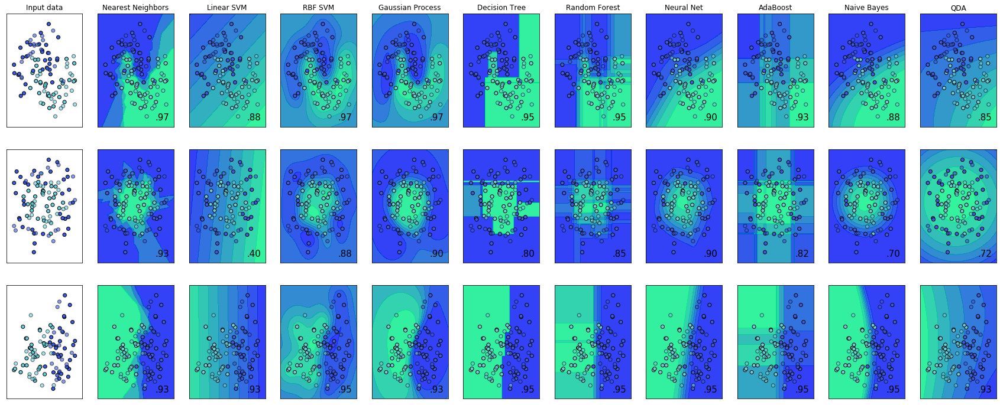

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

h = .02  # step size in the mesh

names = ["Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]

X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=1, n_clusters_per_class=1)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)

datasets = [make_moons(noise=0.3, random_state=0),
            make_circles(noise=0.2, factor=0.5, random_state=1),
            linearly_separable
            ]


figure = plt.figure(figsize=(30, 12))

i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.4, random_state=42)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # just plot the dataset first
    cm = plt.cm.winter
    cm_bright = ListedColormap(['#3B5ADC', '#67CDD9'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        # Plot the decision boundary. For that, we will assign a color to each
        # point in the mesh [x_min, x_max]x[y_min, y_max].
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        # Put the result into a color plot
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        i += 1

# plt.tight_layout()
plt.show()

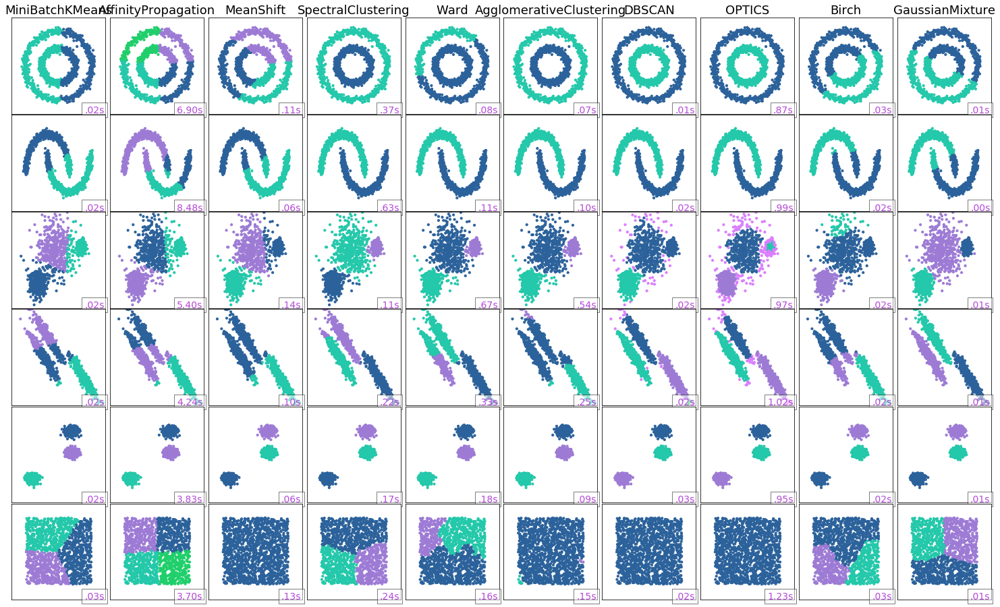

In [108]:
import time
import warnings

import numpy as np
import matplotlib.pyplot as plt

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler
from itertools import cycle, islice

np.random.seed(0)

# ============
# Generate datasets. We choose the size big enough to see the scalability
# of the algorithms, but not too big to avoid too long running times
# ============
n_samples = 1500
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=.5,
                                      noise=.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

# Anisotropicly distributed data
random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

# blobs with varied variances
varied = datasets.make_blobs(n_samples=n_samples,
                             cluster_std=[1.0, 2.5, 0.5],
                             random_state=random_state)

# ============
# Set up cluster parameters
# ============
plt.figure(figsize=(9 * 2 + 3, 12.5))
plt.subplots_adjust(left=.02, right=.98, bottom=.001, top=.96, wspace=.05,
                    hspace=.01)

plot_num = 1

default_base = {'quantile': .3,
                'eps': .3,
                'damping': .9,
                'preference': -200,
                'n_neighbors': 10,
                'n_clusters': 3,
                'min_samples': 20,
                'xi': 0.05,
                'min_cluster_size': 0.1}

datasets = [
    (noisy_circles, {'damping': .77, 'preference': -240,
                     'quantile': .2, 'n_clusters': 2,
                     'min_samples': 20, 'xi': 0.25}),
    (noisy_moons, {'damping': .75, 'preference': -220, 'n_clusters': 2}),
    (varied, {'eps': .18, 'n_neighbors': 2,
              'min_samples': 5, 'xi': 0.035, 'min_cluster_size': .2}),
    (aniso, {'eps': .15, 'n_neighbors': 2,
             'min_samples': 20, 'xi': 0.1, 'min_cluster_size': .2}),
    (blobs, {}),
    (no_structure, {})]

for i_dataset, (dataset, algo_params) in enumerate(datasets):
    # update parameters with dataset-specific values
    params = default_base.copy()
    params.update(algo_params)

    X, y = dataset

    # normalize dataset for easier parameter selection
    X = StandardScaler().fit_transform(X)

    # estimate bandwidth for mean shift
    bandwidth = cluster.estimate_bandwidth(X, quantile=params['quantile'])

    # connectivity matrix for structured Ward
    connectivity = kneighbors_graph(
        X, n_neighbors=params['n_neighbors'], include_self=False)
    # make connectivity symmetric
    connectivity = 0.5 * (connectivity + connectivity.T)

    # ============
    # Create cluster objects
    # ============
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True)
    two_means = cluster.MiniBatchKMeans(n_clusters=params['n_clusters'])
    ward = cluster.AgglomerativeClustering(
        n_clusters=params['n_clusters'], linkage='ward',
        connectivity=connectivity)
    spectral = cluster.SpectralClustering(
        n_clusters=params['n_clusters'], eigen_solver='arpack',
        affinity="nearest_neighbors")
    dbscan = cluster.DBSCAN(eps=params['eps'])
    optics = cluster.OPTICS(min_samples=params['min_samples'],
                            xi=params['xi'],
                            min_cluster_size=params['min_cluster_size'])
    affinity_propagation = cluster.AffinityPropagation(
        damping=params['damping'], preference=params['preference'])
    average_linkage = cluster.AgglomerativeClustering(
        linkage="average", affinity="cityblock",
        n_clusters=params['n_clusters'], connectivity=connectivity)
    birch = cluster.Birch(n_clusters=params['n_clusters'])
    gmm = mixture.GaussianMixture(
        n_components=params['n_clusters'], covariance_type='full')

    clustering_algorithms = (
        ('MiniBatchKMeans', two_means),
        ('AffinityPropagation', affinity_propagation),
        ('MeanShift', ms),
        ('SpectralClustering', spectral),
        ('Ward', ward),
        ('AgglomerativeClustering', average_linkage),
        ('DBSCAN', dbscan),
        ('OPTICS', optics),
        ('Birch', birch),
        ('GaussianMixture', gmm)
    )

    for name, algorithm in clustering_algorithms:
        t0 = time.time()

        # catch warnings related to kneighbors_graph
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the " +
                "connectivity matrix is [0-9]{1,2}" +
                " > 1. Completing it to avoid stopping the tree early.",
                category=UserWarning)
            warnings.filterwarnings(
                "ignore",
                message="Graph is not fully connected, spectral embedding" +
                " may not work as expected.",
                category=UserWarning)
            algorithm.fit(X)

        t1 = time.time()
        if hasattr(algorithm, 'labels_'):
            y_pred = algorithm.labels_.astype(np.int)
        else:
            y_pred = algorithm.predict(X)

        plt.subplot(len(datasets), len(clustering_algorithms), plot_num)
        if i_dataset == 0:
            plt.title(name, size=18)

        colors = np.array(list(islice(cycle(['#2C629B', '#24C8AA', '#9D7BD5',
                                             '#20CF6B', '#B548D8', '#341D98',
                                             '#77F2FC', '#FB5A36', '#2C6CFF']),
                                      int(max(y_pred) + 1))))
        # add purple color for outliers (if any)
        colors = np.append(colors, ["#DA7FFE"])
        plt.scatter(X[:, 0], X[:, 1], s=10, color=colors[y_pred])

        plt.xlim(-2.5, 2.5)
        plt.ylim(-2.5, 2.5)
        plt.xticks(())
        plt.yticks(())
        plt.text(.99, .01, ('%.2fs' % (t1 - t0)).lstrip('0'),
                 transform=plt.gca().transAxes, size=14,
                 horizontalalignment='right', bbox=dict(facecolor='white', alpha=0.5),
                color='#B548D8')
        plot_num += 1

plt.show()

In [8]:
import plotly.graph_objects as go
import plotly.figure_factory as ff

import numpy as np
from scipy.spatial.distance import pdist, squareform

# get data
data = np.genfromtxt("http://files.figshare.com/2133304/ExpRawData_E_TABM_84_A_AFFY_44.tab",
                     names=True,usecols=tuple(range(1,30)),dtype=float, delimiter="\t")
data_array = data.view((np.float, len(data.dtype.names)))
data_array = data_array.transpose()
labels = data.dtype.names

# Initialize figure by creating upper dendrogram
fig = ff.create_dendrogram(data_array, orientation='bottom', labels=labels)
for i in range(len(fig['data'])):
    fig['data'][i]['yaxis'] = 'y2'

# Create Side Dendrogram
dendro_side = ff.create_dendrogram(data_array, orientation='right')
for i in range(len(dendro_side['data'])):
    dendro_side['data'][i]['xaxis'] = 'x2'

# Add Side Dendrogram Data to Figure
for data in dendro_side['data']:
    fig.add_trace(data)

# Create Heatmap
dendro_leaves = dendro_side['layout']['yaxis']['ticktext']
dendro_leaves = list(map(int, dendro_leaves))
data_dist = pdist(data_array)
heat_data = squareform(data_dist)
heat_data = heat_data[dendro_leaves,:]
heat_data = heat_data[:,dendro_leaves]

heatmap = [
    go.Heatmap(
        x = dendro_leaves,
        y = dendro_leaves,
        z = heat_data,
        colorscale = 'Blues'
    )
]

heatmap[0]['x'] = fig['layout']['xaxis']['tickvals']
heatmap[0]['y'] = dendro_side['layout']['yaxis']['tickvals']

# Add Heatmap Data to Figure
for data in heatmap:
    fig.add_trace(data)

# Edit Layout
fig.update_layout({'width':800, 'height':800,
                         'showlegend':False, 'hovermode': 'closest',
                         })
# Edit xaxis
fig.update_layout(xaxis={'domain': [.15, 1],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'ticks':""})
# Edit xaxis2
fig.update_layout(xaxis2={'domain': [0, .15],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Edit yaxis
fig.update_layout(yaxis={'domain': [0, .85],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'showticklabels': False,
                                  'ticks': ""
                        })
# Edit yaxis2
fig.update_layout(yaxis2={'domain':[.825, .975],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Plot!
fig.show()

In [9]:
data = np.genfromtxt("http://files.figshare.com/2133304/ExpRawData_E_TABM_84_A_AFFY_44.tab",
                     names=True,usecols=tuple(range(1,30)),dtype=float, delimiter="\t")
data_array = data.view((np.float, len(data.dtype.names)))
data_array1 = data_array.transpose()
# labels = data.dtype.names

print(data)
print('')
print('first_data_array',data_array)
print('')
print('second_data_array',data_array1)
dendro_side

[( 6.3739767,  6.4981704,  6.271771 ,  6.0920415,  6.095927,  6.231528 ,  6.224557 ,  6.08838 ,  6.434522 ,  6.021769,  6.217328 ,  6.687939 ,  6.225536 ,  6.674436 ,  6.164399,  5.216565 ,  6.543141 ,  5.2118945,  6.68567  ,  5.9021454,  5.933372 ,  7.1124387,  5.318629 ,  6.2156105,  6.1803956,  6.1591606,  6.112102 ,  6.359853,  6.010906 )
 ( 5.986182 ,  4.861167 ,  5.5666986,  5.5902267,  5.442939,  4.813677 ,  5.8469415,  5.287694,  5.1058507,  5.274638,  5.123789 ,  5.541933 ,  5.831072 ,  5.980615 ,  6.346776,  5.3249087,  5.6799436,  5.681097 ,  6.0617695,  6.036499 ,  5.8270006,  5.8877964,  5.5475674,  4.907229 ,  6.068774 ,  5.0605383,  5.0324726,  6.12955 ,  5.4538217)
 ( 7.468118 ,  6.9479957,  6.9435835,  7.5366983,  6.891398,  6.991917 ,  7.4803615,  7.085893,  6.991272 ,  6.874221,  6.8315153,  7.0676675,  7.1330795,  8.561509 ,  7.046149,  8.101516 ,  7.335046 ,  8.17105  ,  8.522211 ,  7.287495 ,  7.4924145,  8.600026 ,  7.9293165,  6.9765787,  8.518147 ,  6.906314 , 

In [67]:
import plotly.graph_objects as go
import plotly.figure_factory as ff

import numpy as np
from scipy.spatial.distance import pdist, squareform

# get data
data = df
data = df.sample(frac=0.2, random_state = 1)
data_array = df.values
# data_array = data.view((np.float, len(data.dtype.names)))
data_array = data_array.transpose()
labels = data.columns

# Initialize figure by creating upper dendrogram
fig = ff.create_dendrogram(data_array, orientation='bottom', labels=labels)
for i in range(len(fig['data'])):
    fig['data'][i]['yaxis'] = 'y2'

# Create Side Dendrogram
dendro_side = ff.create_dendrogram(data_array, orientation='right')
for i in range(len(dendro_side['data'])):
    dendro_side['data'][i]['xaxis'] = 'x2'

# Add Side Dendrogram Data to Figure
for data in dendro_side['data']:
    fig.add_trace(data)

# Create Heatmap
dendro_leaves = dendro_side['layout']['yaxis']['ticktext']
dendro_leaves = list(map(int, dendro_leaves))
data_dist = pdist(data_array)
heat_data = squareform(data_dist)
heat_data = heat_data[dendro_leaves,:]
heat_data = heat_data[:,dendro_leaves]

heatmap = [
    go.Heatmap(
        x = dendro_leaves,
        y = dendro_leaves,
        z = heat_data,
        colorscale = 'Blues'
    )
]

heatmap[0]['x'] = fig['layout']['xaxis']['tickvals']
heatmap[0]['y'] = dendro_side['layout']['yaxis']['tickvals']

# Add Heatmap Data to Figure
for data in heatmap:
    fig.add_trace(data)

# Edit Layout
fig.update_layout({'width':800, 'height':800,
                         'showlegend':False, 'hovermode': 'closest',
                         })
# Edit xaxis
fig.update_layout(xaxis={'domain': [.15, 1],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'ticks':""})
# Edit xaxis2
fig.update_layout(xaxis2={'domain': [0, .15],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Edit yaxis
fig.update_layout(yaxis={'domain': [0, .85],
                                  'mirror': False,
                                  'showgrid': False,
                                  'showline': False,
                                  'zeroline': False,
                                  'showticklabels': False,
                                  'ticks': ""
                        })
# Edit yaxis2
fig.update_layout(yaxis2={'domain':[.825, .975],
                                   'mirror': False,
                                   'showgrid': False,
                                   'showline': False,
                                   'zeroline': False,
                                   'showticklabels': False,
                                   'ticks':""})

# Plot!
fig.show()